### <b>Objective:</b>
This question requires you to create a basic facial recognition system using a technique called principal component analysis (PCA) 
by projecting the face images on the feature space (face space) which best
represents the variations among distinct faces. The face space is defined as the
“Eigenfaces", which are the eigenvectors of the set of faces.

The goal of implementing this system is to recognize a person's face by comparing it to a pre-existing database of faces, and identifying the closest match.

### <b>About the dataset:</b>  
The AT&T face dataset contains a set of grayscale face images with dimensions 92x112. The images are organised in 40 directories (one for each subject), which have names of the form sX, where X indicates the subject number (between 1 and 40). In each of these directories, there are ten different images of that subject, which have names of the form Y.pgm, where Y is the image number for that subject (between 1 and 10). These 10 images per person are taken at different times, varying the lighting, facial expressions (open / closed eyes, smiling / not smiling) and facial details (glasses / no glasses). All the images were taken against a dark homogeneous background with the subjects in an upright, frontal position (with tolerance for some side movement). <b>Link:</b> [https://git-disl.github.io/GTDLBench/datasets/att_face_dataset/](https://git-disl.github.io/GTDLBench/datasets/att_face_dataset/)

### Tasks
1. Load dataset and divide the date into training and test sets. 
2. Implement the PCA algorithm from scratch.
3. Implement image reconstruction using the eigen projections and visualise differences for different number of components.
4. Visualise the mean(Eigen face) generated.
5. Given training set, obtain accuracy by attempting a face regonition module and obtaining the accuracy for different number of principal components.

In [1]:
import numpy as np
import os
import cv2
from matplotlib import pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.image as mpimg
import matplotlib
from scipy.linalg import eigh
from numpy import linalg as LA
import random
from tabulate import tabulate

In [2]:
## list all folders in root folder
root="/Users/alinahasan/Desktop/ATnT"
data=os.listdir(root)
print(data,len(data))
data.remove('.DS_Store')
print(data,len(data))


['s34', 's33', 's5', 's2', 's32', 's35', 's3', 's4', '.DS_Store', 's26', 's19', 's21', 's17', 's28', 's10', 's11', 's16', 's29', 's20', 's27', 's18', 's8', 's1', 's6', 's39', 's30', 's37', 's7', 's9', 's36', 's31', 's38', 's22', 's25', 's13', 's14', 's40', 's15', 's12', 's24', 's23'] 41
['s34', 's33', 's5', 's2', 's32', 's35', 's3', 's4', 's26', 's19', 's21', 's17', 's28', 's10', 's11', 's16', 's29', 's20', 's27', 's18', 's8', 's1', 's6', 's39', 's30', 's37', 's7', 's9', 's36', 's31', 's38', 's22', 's25', 's13', 's14', 's40', 's15', 's12', 's24', 's23'] 40


In [3]:
#information of the data 
print("There are {} images in the dataset".format(len(data)))


There are 40 images in the dataset


In [4]:
#to see images of the given data
def scan_folder(parent):
    # iterate over all the files in directory 'parent'
    for file_name in os.listdir(parent):
        if file_name.endswith("."):
            # if it's a txt file, print its name (or do whatever you want)
            print(file_name)
        else:
            current_path = os.path.join(parent, file_name)
            if os.path.isdir(current_path):
                # if we're checking a sub-directory, recursively call this method
                scan_folder(current_path)

scan_folder("/Users/alinahasan/Desktop/ATnT")  # Insert parent direcotry's path


7.pgm


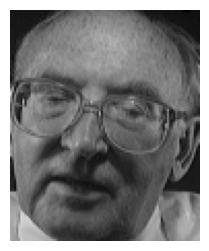

Original Color:
6.pgm


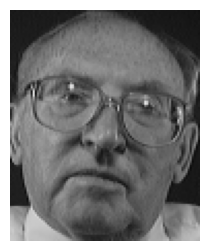

Original Color:
4.pgm


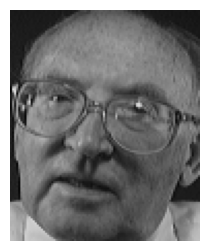

Original Color:
5.pgm


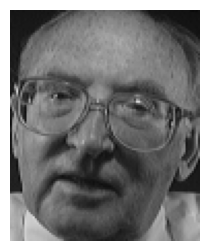

Original Color:
1.pgm


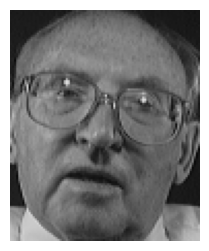

Original Color:
2.pgm


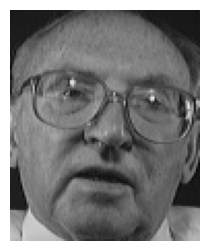

Original Color:
3.pgm


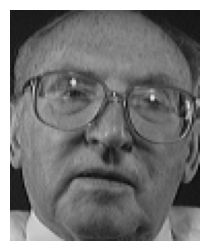

Original Color:
8.pgm


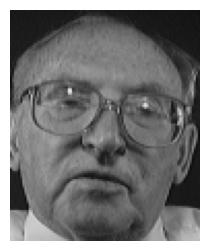

Original Color:
9.pgm


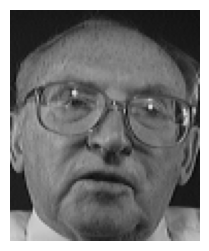

Original Color:
10.pgm


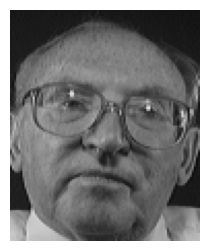

Original Color:
7.pgm


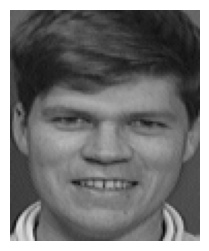

Original Color:
6.pgm


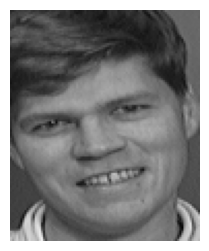

Original Color:
4.pgm


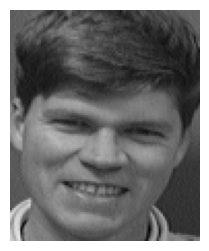

Original Color:
5.pgm


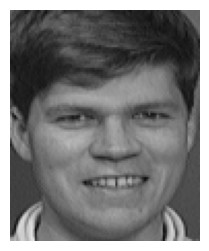

Original Color:
1.pgm


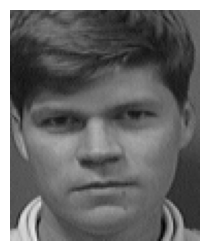

Original Color:
2.pgm


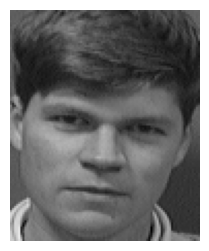

Original Color:
3.pgm


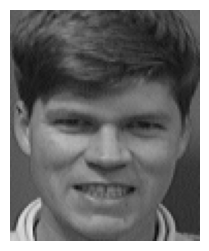

Original Color:
8.pgm


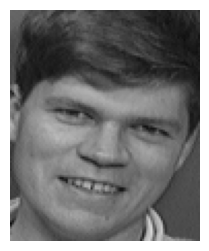

Original Color:
9.pgm


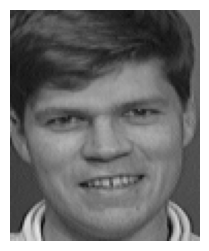

Original Color:
10.pgm


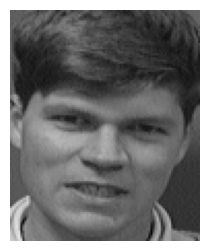

Original Color:
7.pgm


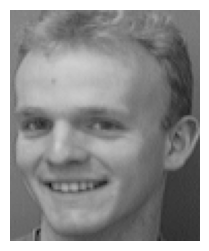

Original Color:
6.pgm


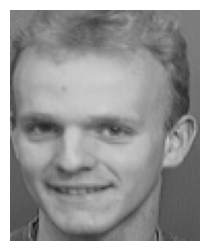

Original Color:
4.pgm


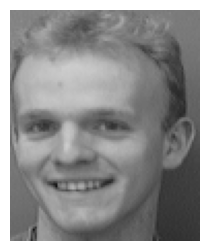

Original Color:
5.pgm


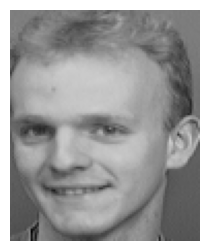

Original Color:
1.pgm


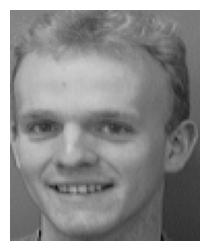

Original Color:
2.pgm


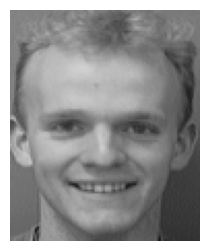

Original Color:
3.pgm


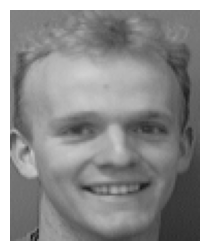

Original Color:
8.pgm


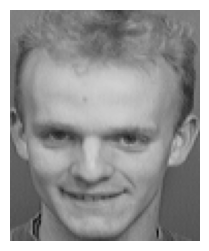

Original Color:
9.pgm


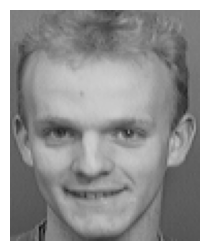

Original Color:
10.pgm


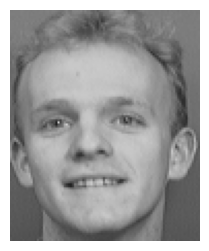

Original Color:
7.pgm


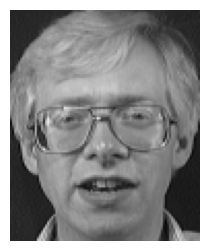

Original Color:
6.pgm


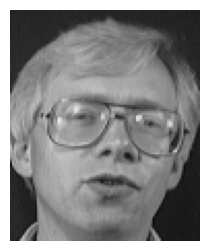

Original Color:
4.pgm


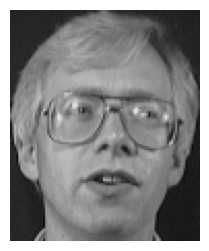

Original Color:
5.pgm


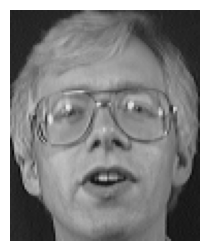

Original Color:
1.pgm


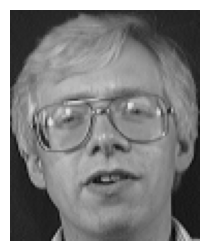

Original Color:
2.pgm


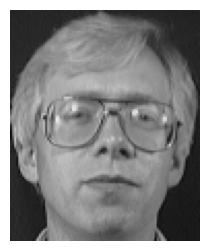

Original Color:
3.pgm


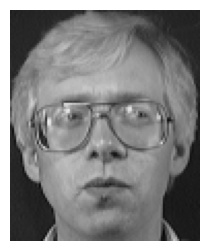

Original Color:
8.pgm


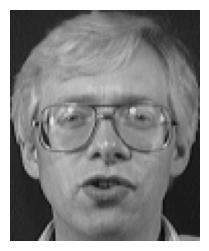

Original Color:
9.pgm


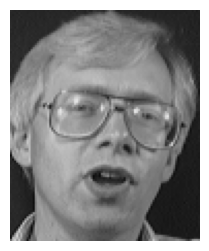

Original Color:
10.pgm


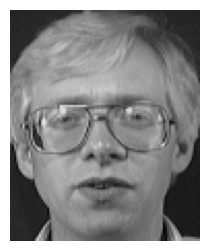

Original Color:
7.pgm


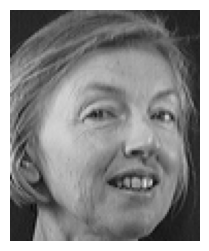

Original Color:
6.pgm


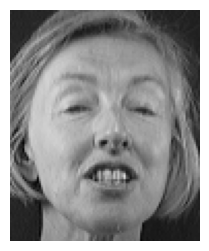

Original Color:
4.pgm


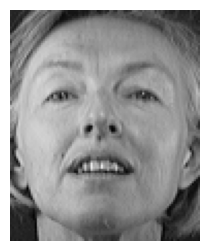

Original Color:
5.pgm


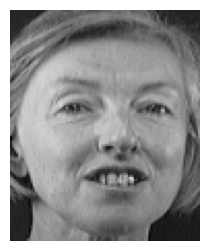

Original Color:
1.pgm


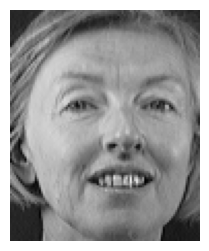

Original Color:
2.pgm


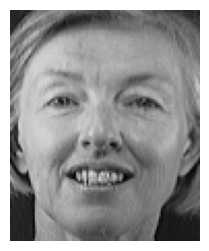

Original Color:
3.pgm


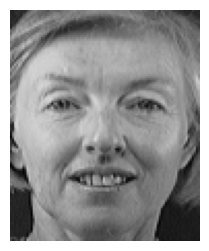

Original Color:
8.pgm


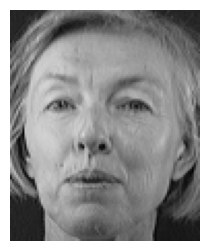

Original Color:
9.pgm


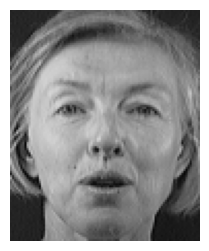

Original Color:
10.pgm


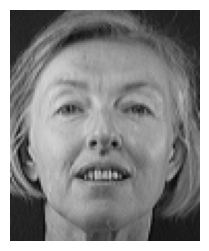

Original Color:
7.pgm


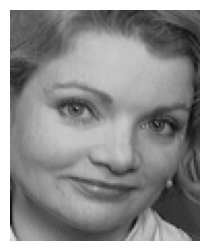

Original Color:
6.pgm


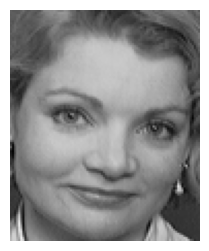

Original Color:
4.pgm


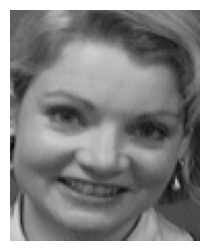

Original Color:
5.pgm


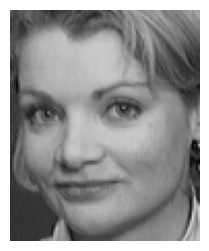

Original Color:
1.pgm


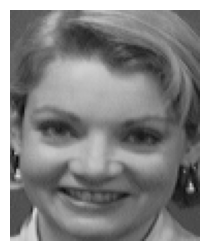

Original Color:
2.pgm


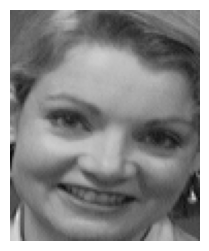

Original Color:
3.pgm


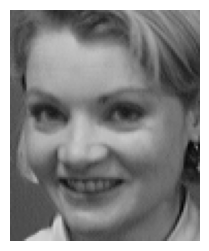

Original Color:
8.pgm


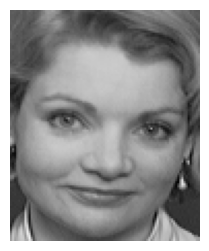

Original Color:
9.pgm


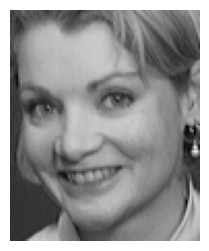

Original Color:
10.pgm


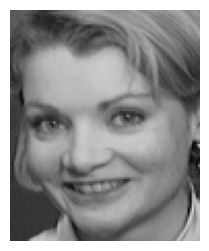

Original Color:
7.pgm


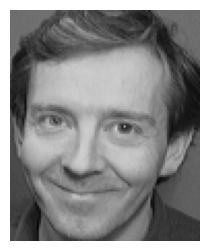

Original Color:
6.pgm


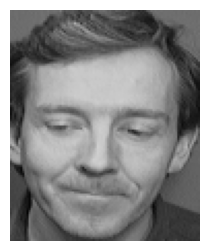

Original Color:
4.pgm


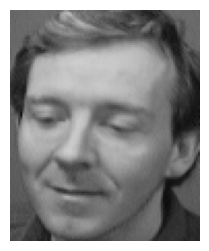

Original Color:
5.pgm


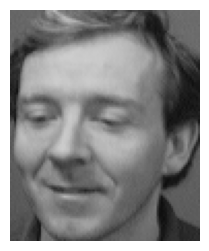

Original Color:
1.pgm


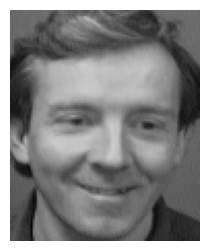

Original Color:
2.pgm


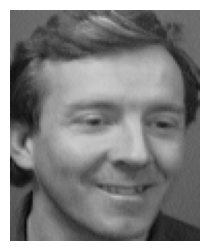

Original Color:
3.pgm


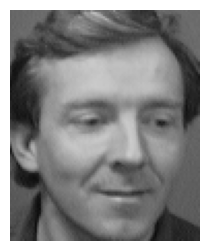

Original Color:
8.pgm


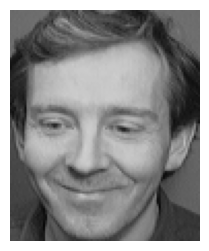

Original Color:
9.pgm


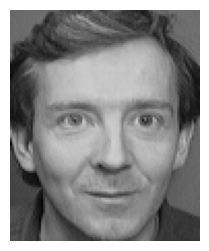

Original Color:
10.pgm


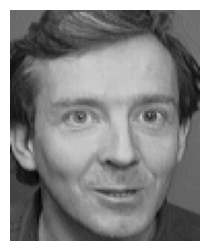

Original Color:
7.pgm


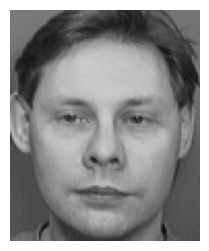

Original Color:
6.pgm


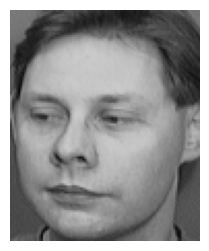

Original Color:
4.pgm


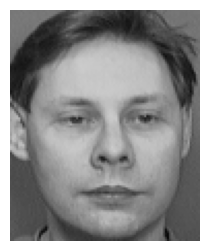

Original Color:
5.pgm


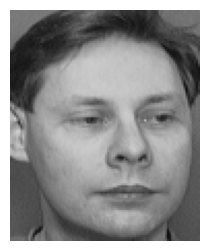

Original Color:
1.pgm


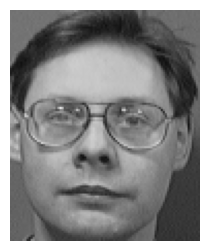

Original Color:
2.pgm


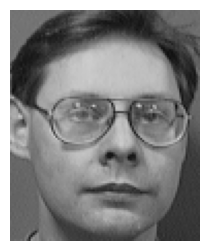

Original Color:
3.pgm


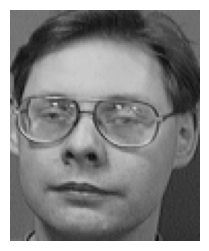

Original Color:
8.pgm


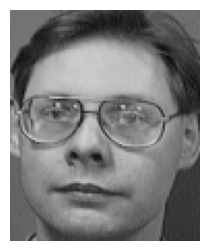

Original Color:
9.pgm


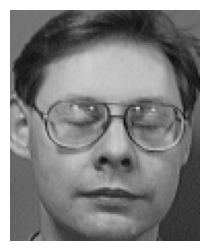

Original Color:
10.pgm


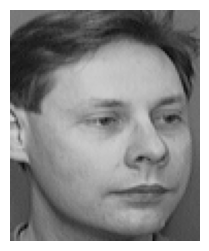

Original Color:
7.pgm


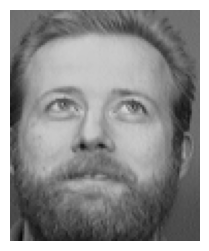

Original Color:
6.pgm


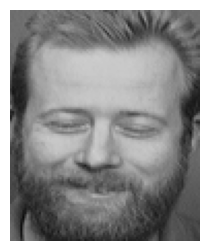

Original Color:
4.pgm


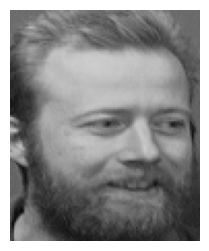

Original Color:
5.pgm


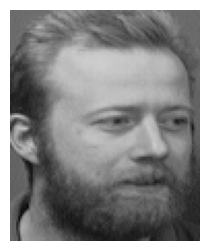

Original Color:
1.pgm


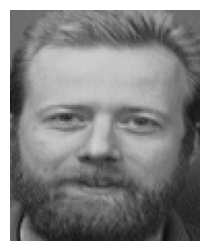

Original Color:
2.pgm


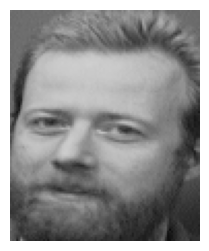

Original Color:
3.pgm


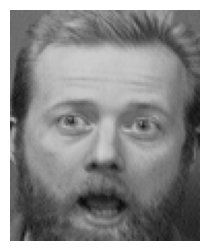

Original Color:
8.pgm


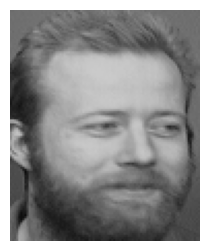

Original Color:
9.pgm


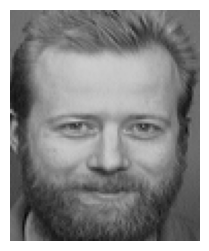

Original Color:
10.pgm


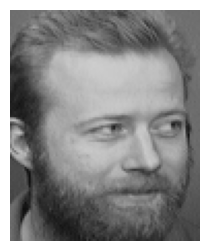

Original Color:
7.pgm


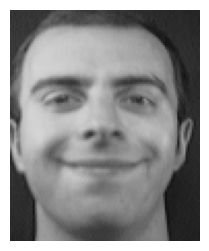

Original Color:
6.pgm


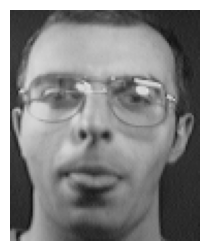

Original Color:
4.pgm


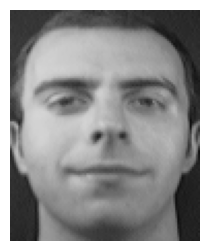

Original Color:
5.pgm


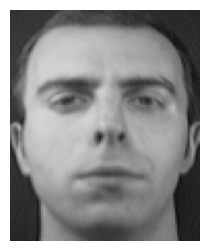

Original Color:
1.pgm


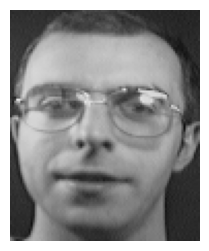

Original Color:
2.pgm


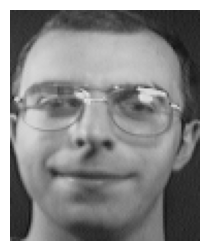

Original Color:
3.pgm


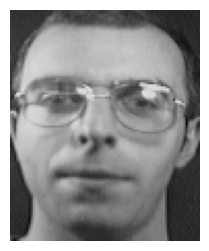

Original Color:
8.pgm


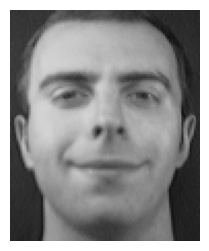

Original Color:
9.pgm


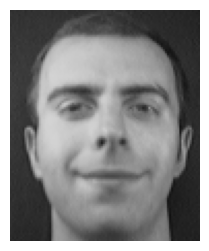

Original Color:
10.pgm


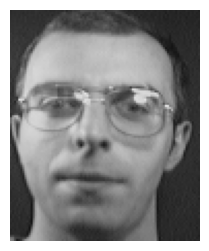

Original Color:
7.pgm


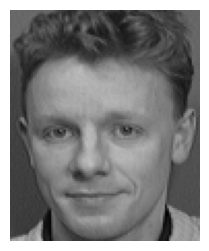

Original Color:
6.pgm


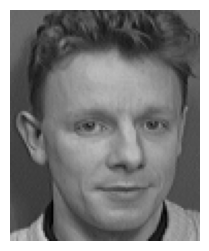

Original Color:
4.pgm


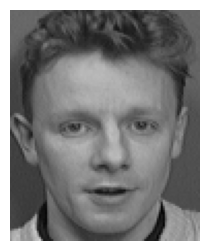

Original Color:
5.pgm


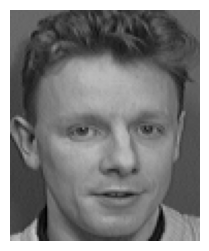

Original Color:
1.pgm


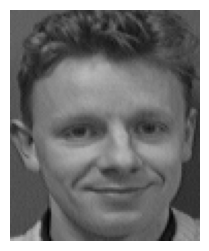

Original Color:
2.pgm


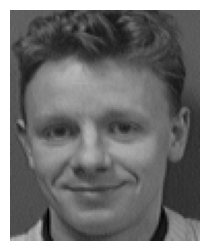

Original Color:
3.pgm


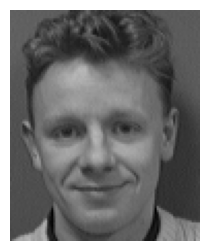

Original Color:
8.pgm


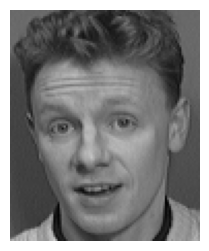

Original Color:
9.pgm


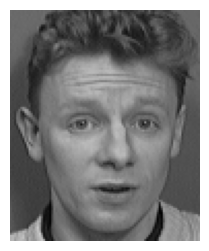

Original Color:
10.pgm


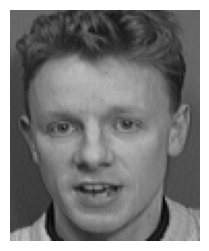

Original Color:
7.pgm


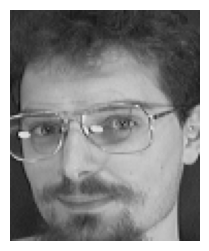

Original Color:
6.pgm


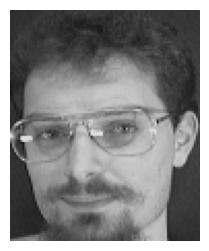

Original Color:
4.pgm


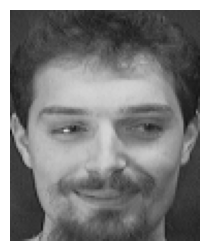

Original Color:
5.pgm


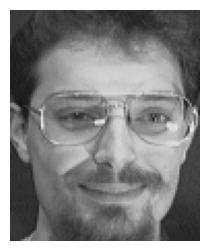

Original Color:
1.pgm


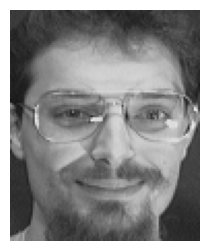

Original Color:
2.pgm


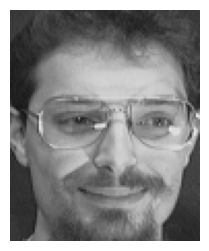

Original Color:
3.pgm


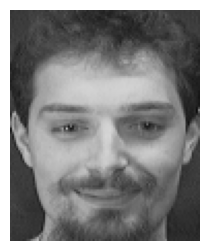

Original Color:
8.pgm


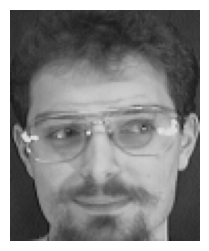

Original Color:
9.pgm


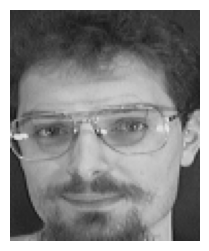

Original Color:
10.pgm


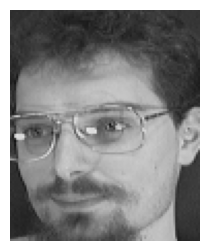

Original Color:
7.pgm


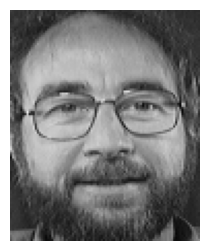

Original Color:
6.pgm


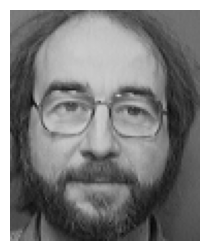

Original Color:
4.pgm


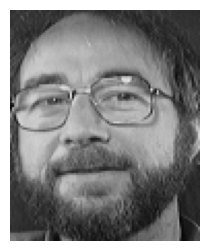

Original Color:
5.pgm


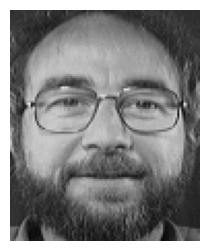

Original Color:
1.pgm


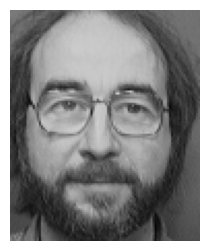

Original Color:
2.pgm


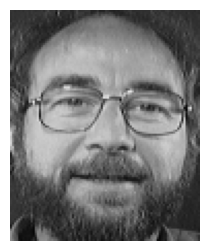

Original Color:
3.pgm


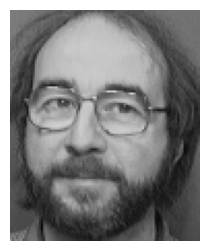

Original Color:
8.pgm


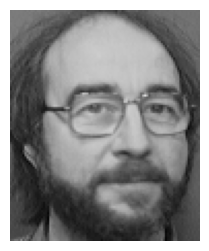

Original Color:
9.pgm


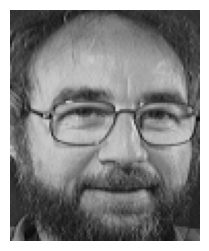

Original Color:
10.pgm


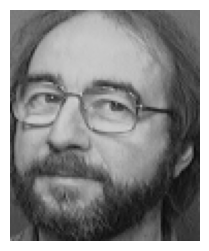

Original Color:
7.pgm


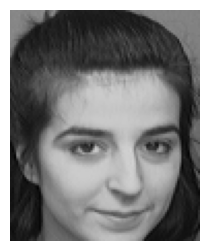

Original Color:
6.pgm


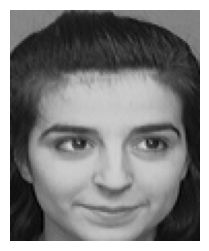

Original Color:
4.pgm


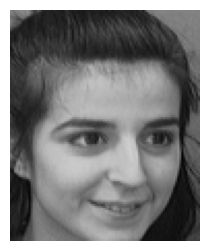

Original Color:
5.pgm


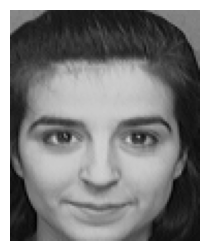

Original Color:
1.pgm


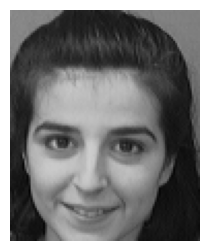

Original Color:
2.pgm


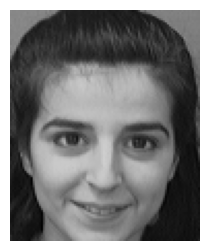

Original Color:
3.pgm


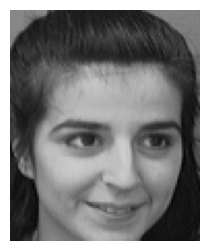

Original Color:
8.pgm


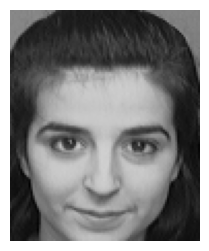

Original Color:
9.pgm


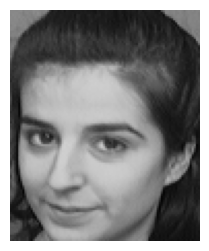

Original Color:
10.pgm


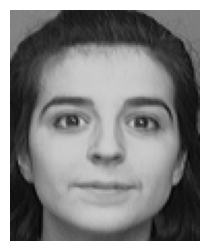

Original Color:
7.pgm


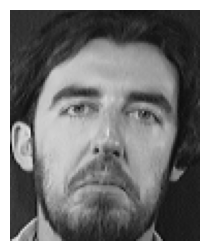

Original Color:
6.pgm


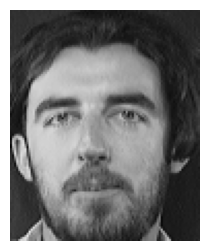

Original Color:
4.pgm


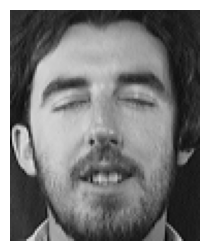

Original Color:
5.pgm


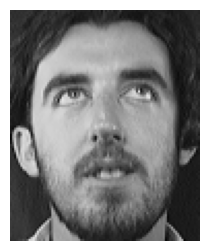

Original Color:
1.pgm


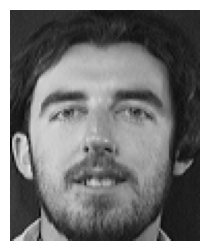

Original Color:
2.pgm


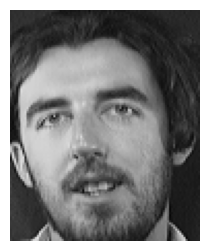

Original Color:
3.pgm


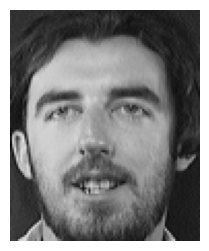

Original Color:
8.pgm


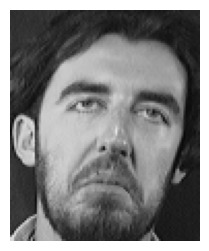

Original Color:
9.pgm


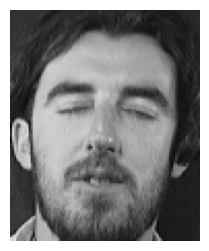

Original Color:
10.pgm


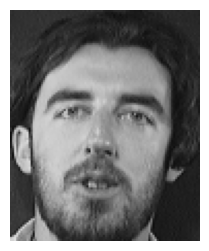

Original Color:
7.pgm


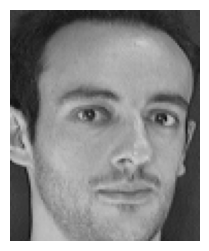

Original Color:
6.pgm


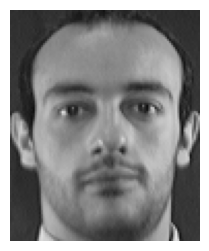

Original Color:
4.pgm


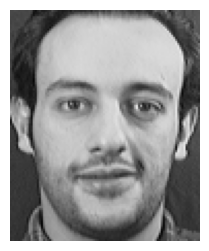

Original Color:
5.pgm


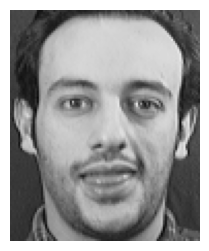

Original Color:
1.pgm


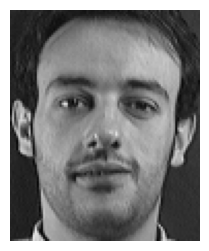

Original Color:
2.pgm


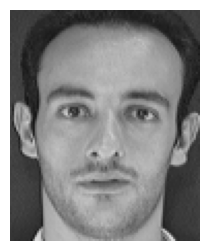

Original Color:
3.pgm


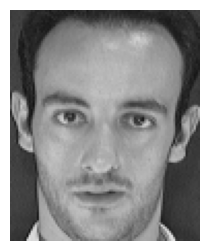

Original Color:
8.pgm


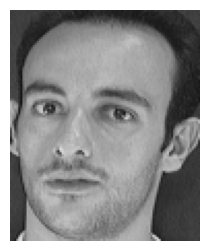

Original Color:
9.pgm


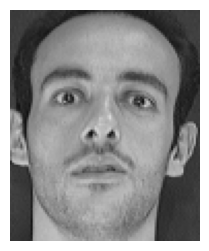

Original Color:
10.pgm


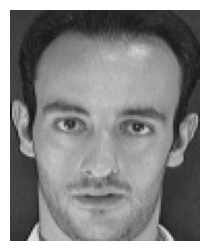

Original Color:
7.pgm


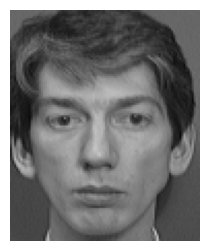

Original Color:
6.pgm


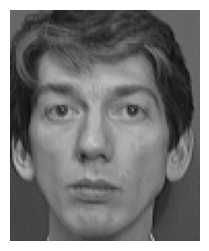

Original Color:
4.pgm


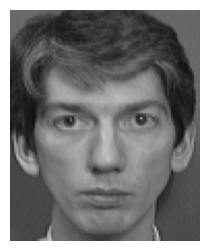

Original Color:
5.pgm


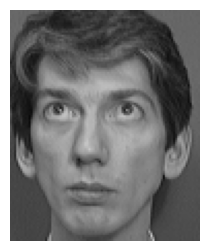

Original Color:
1.pgm


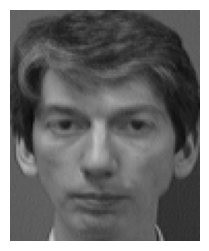

Original Color:
2.pgm


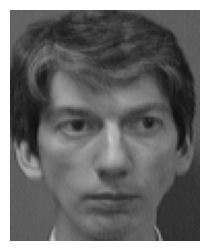

Original Color:
3.pgm


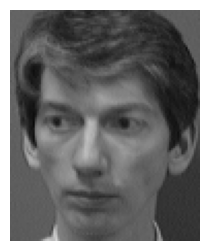

Original Color:
8.pgm


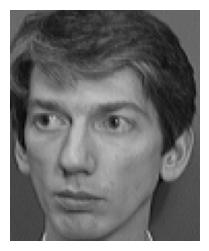

Original Color:
9.pgm


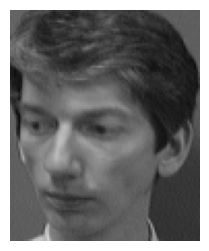

Original Color:
10.pgm


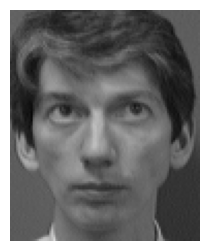

Original Color:
7.pgm


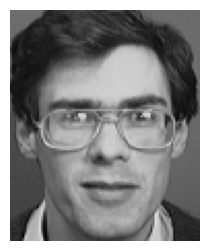

Original Color:
6.pgm


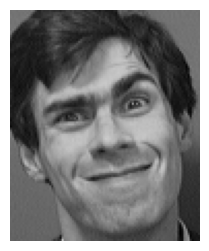

Original Color:
4.pgm


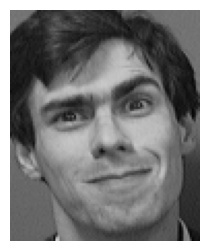

Original Color:
5.pgm


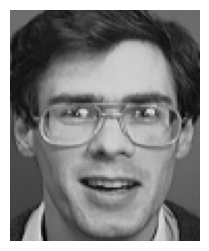

Original Color:
1.pgm


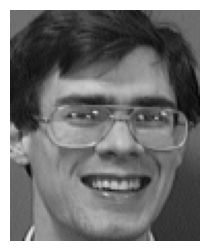

Original Color:
2.pgm


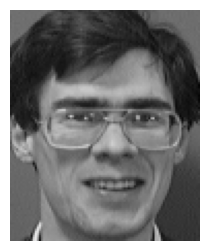

Original Color:
3.pgm


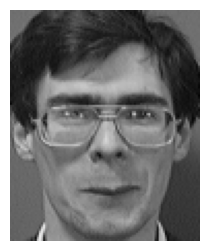

Original Color:
8.pgm


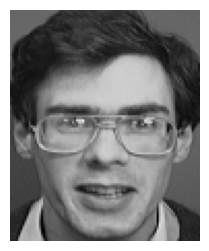

Original Color:
9.pgm


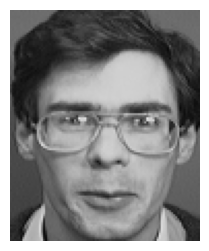

Original Color:
10.pgm


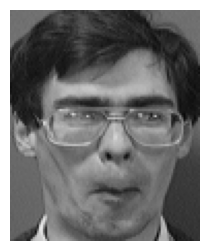

Original Color:
7.pgm


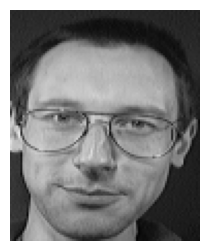

Original Color:
6.pgm


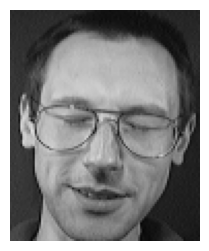

Original Color:
4.pgm


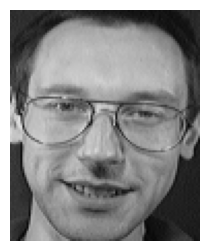

Original Color:
5.pgm


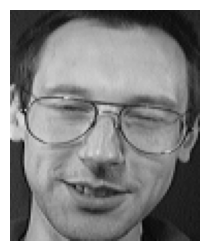

Original Color:
1.pgm


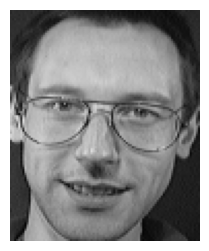

Original Color:
2.pgm


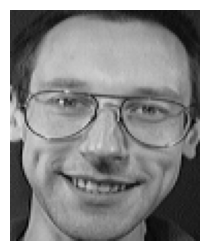

Original Color:
3.pgm


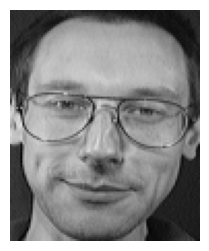

Original Color:
8.pgm


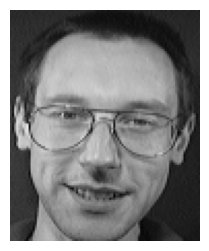

Original Color:
9.pgm


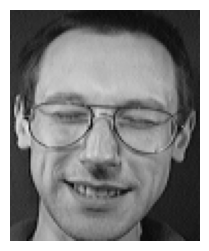

Original Color:
10.pgm


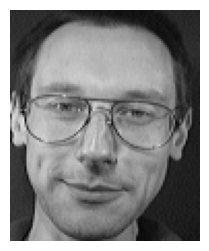

Original Color:
7.pgm


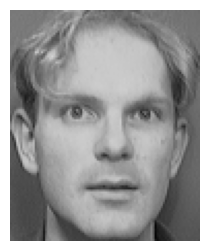

Original Color:
6.pgm


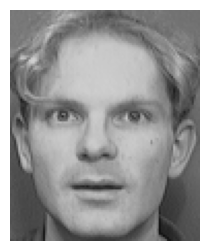

Original Color:
4.pgm


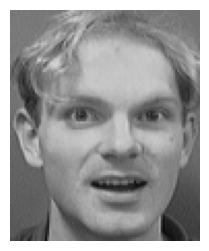

Original Color:
5.pgm


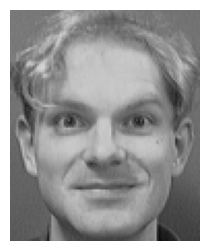

Original Color:
1.pgm


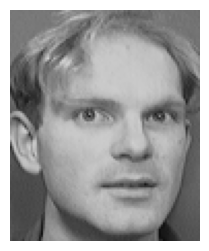

Original Color:
2.pgm


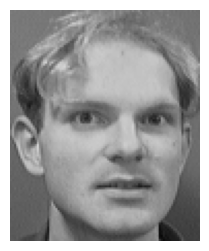

Original Color:
3.pgm


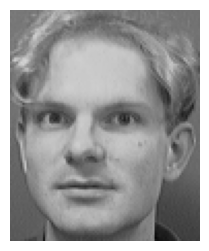

Original Color:
8.pgm


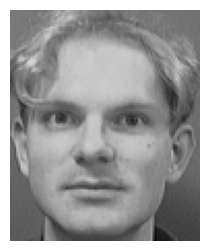

Original Color:
9.pgm


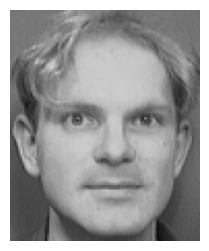

Original Color:
10.pgm


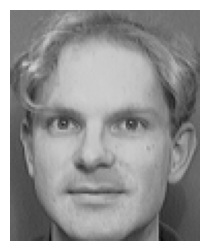

Original Color:
7.pgm


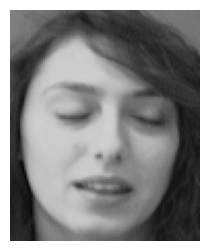

Original Color:
6.pgm


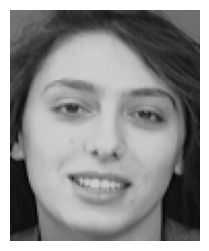

Original Color:
4.pgm


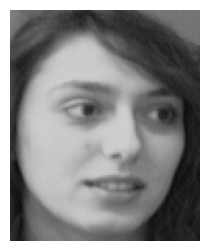

Original Color:
5.pgm


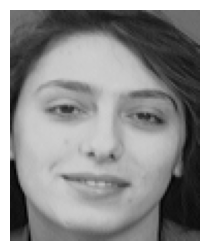

Original Color:
1.pgm


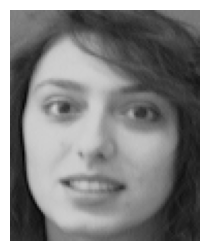

Original Color:
2.pgm


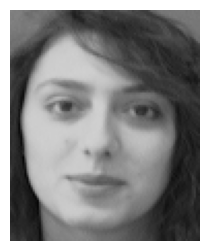

Original Color:
3.pgm


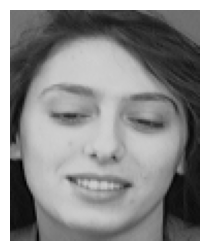

Original Color:
8.pgm


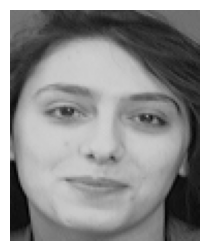

Original Color:
9.pgm


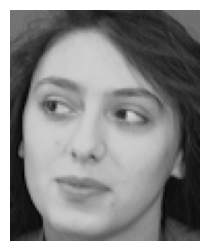

Original Color:
10.pgm


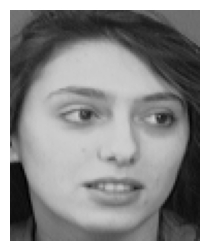

Original Color:
7.pgm


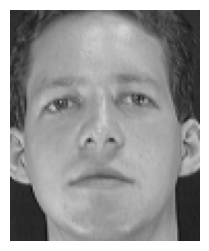

Original Color:
6.pgm


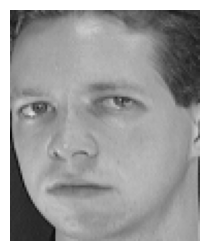

Original Color:
4.pgm


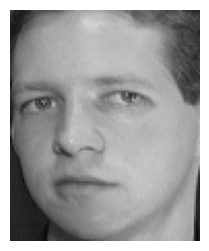

Original Color:
5.pgm


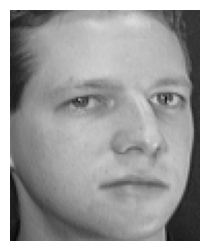

Original Color:
1.pgm


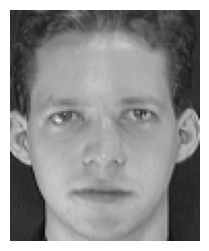

Original Color:
2.pgm


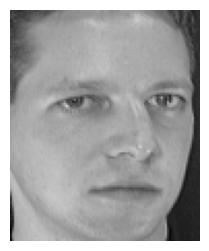

Original Color:
3.pgm


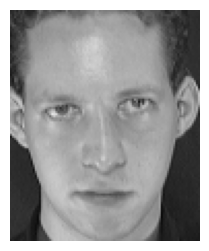

Original Color:
8.pgm


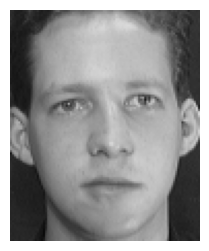

Original Color:
9.pgm


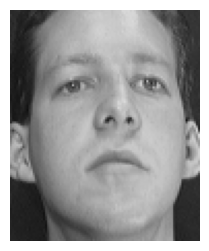

Original Color:
10.pgm


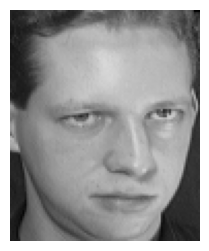

Original Color:
7.pgm


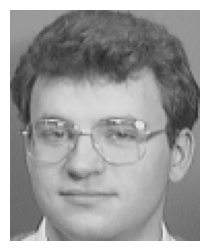

Original Color:
6.pgm


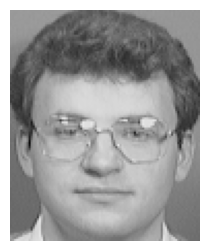

Original Color:
4.pgm


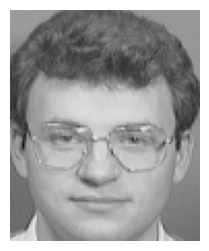

Original Color:
5.pgm


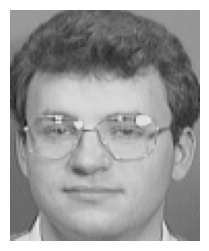

Original Color:
1.pgm


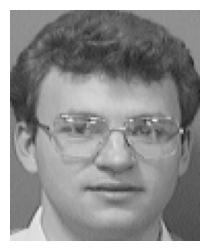

Original Color:
2.pgm


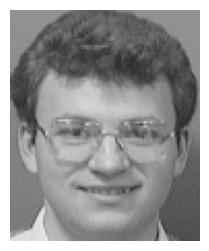

Original Color:
3.pgm


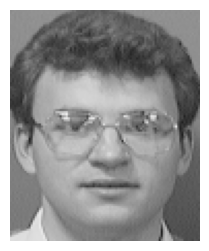

Original Color:
8.pgm


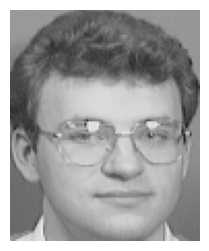

Original Color:
9.pgm


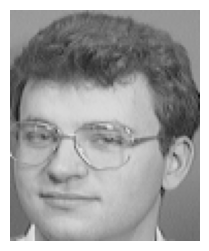

Original Color:
10.pgm


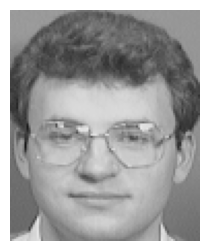

Original Color:
7.pgm


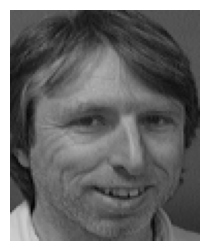

Original Color:
6.pgm


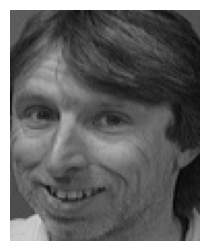

Original Color:
4.pgm


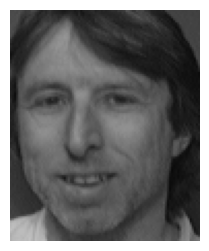

Original Color:
5.pgm


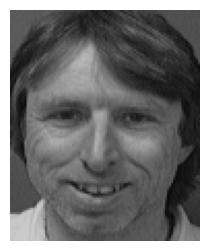

Original Color:
1.pgm


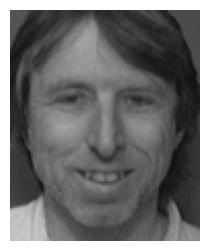

Original Color:
2.pgm


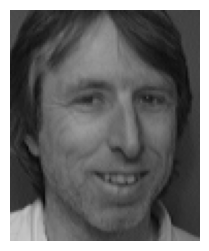

Original Color:
3.pgm


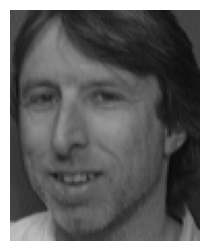

Original Color:
8.pgm


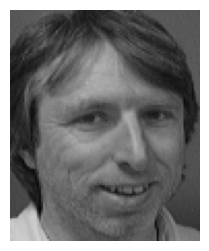

Original Color:
9.pgm


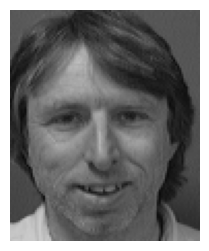

Original Color:
10.pgm


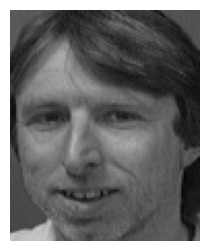

Original Color:
7.pgm


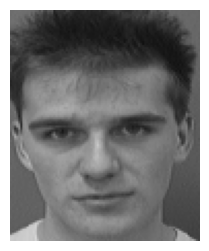

Original Color:
6.pgm


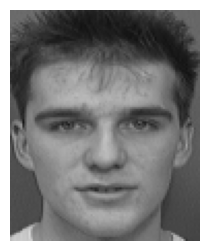

Original Color:
4.pgm


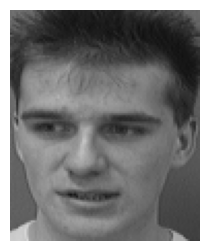

Original Color:
5.pgm


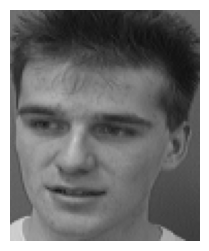

Original Color:
1.pgm


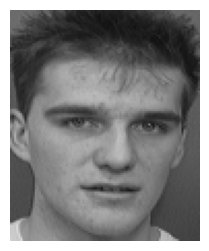

Original Color:
2.pgm


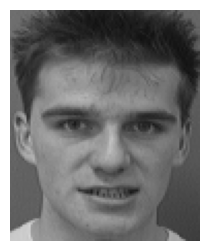

Original Color:
3.pgm


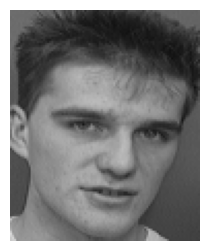

Original Color:
8.pgm


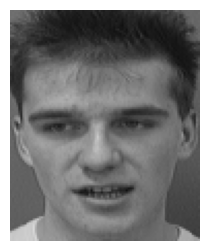

Original Color:
9.pgm


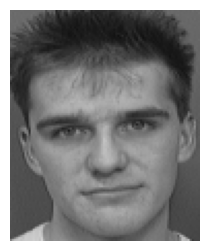

Original Color:
10.pgm


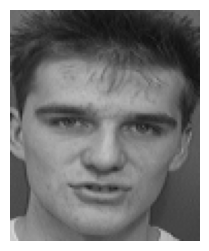

Original Color:
7.pgm


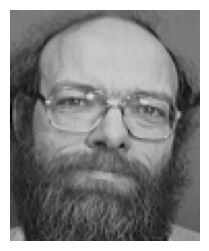

Original Color:
6.pgm


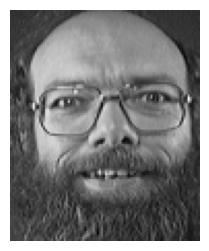

Original Color:
4.pgm


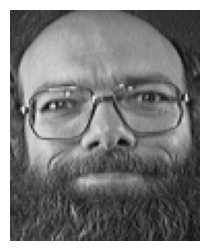

Original Color:
5.pgm


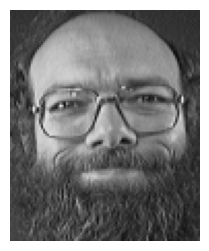

Original Color:
1.pgm


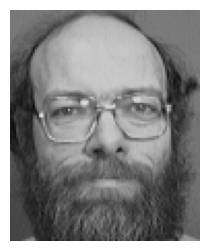

Original Color:
2.pgm


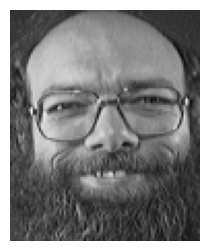

Original Color:
3.pgm


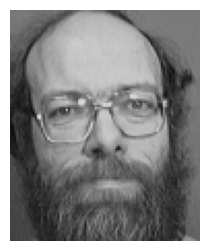

Original Color:
8.pgm


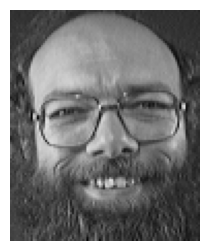

Original Color:
9.pgm


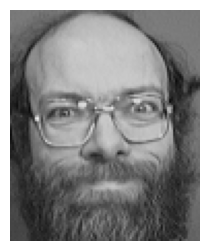

Original Color:
10.pgm


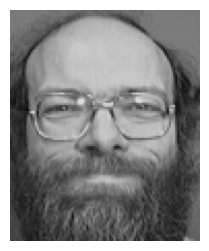

Original Color:
7.pgm


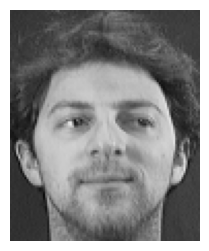

Original Color:
6.pgm


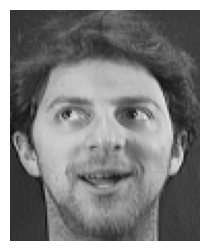

Original Color:
4.pgm


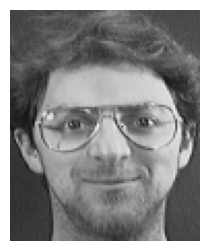

Original Color:
5.pgm


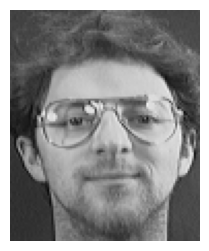

Original Color:
1.pgm


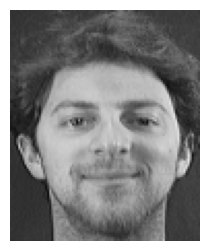

Original Color:
2.pgm


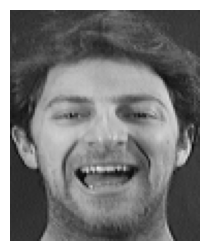

Original Color:
3.pgm


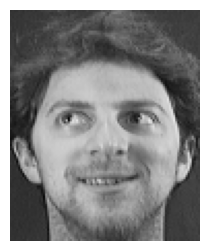

Original Color:
8.pgm


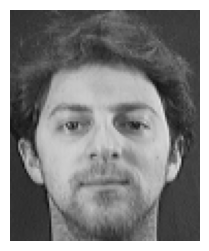

Original Color:
9.pgm


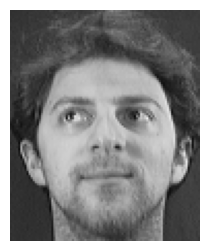

Original Color:
10.pgm


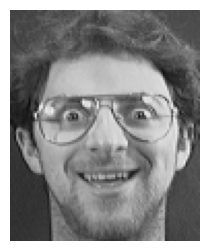

Original Color:
7.pgm


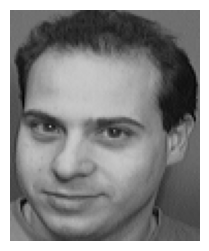

Original Color:
6.pgm


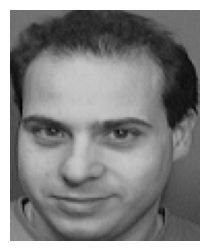

Original Color:
4.pgm


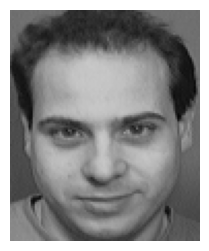

Original Color:
5.pgm


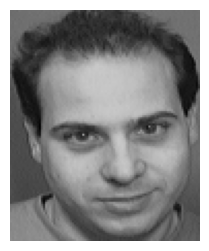

Original Color:
1.pgm


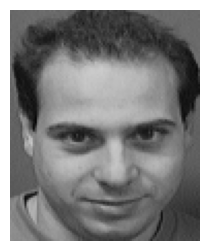

Original Color:
2.pgm


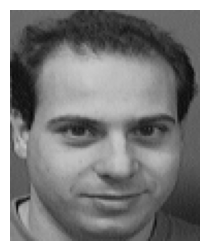

Original Color:
3.pgm


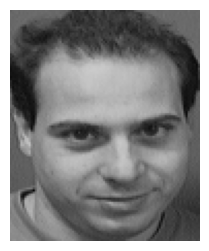

Original Color:
8.pgm


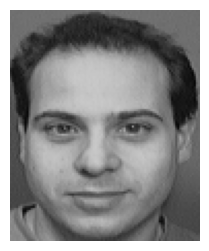

Original Color:
9.pgm


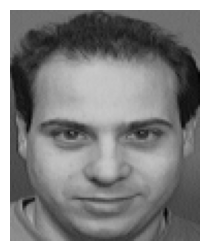

Original Color:
10.pgm


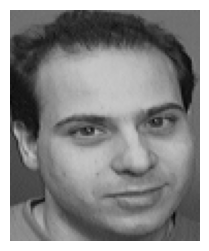

Original Color:
7.pgm


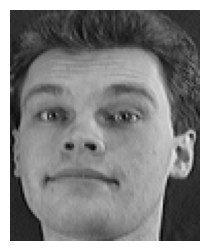

Original Color:
6.pgm


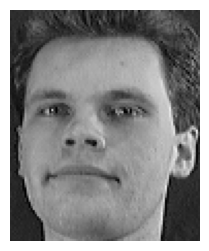

Original Color:
4.pgm


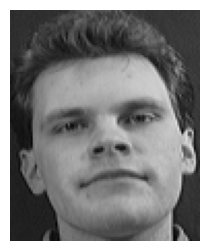

Original Color:
5.pgm


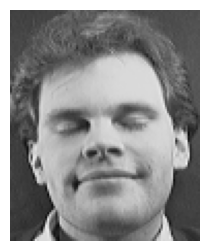

Original Color:
1.pgm


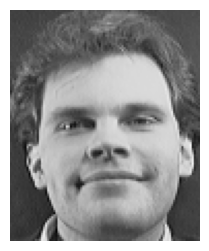

Original Color:
2.pgm


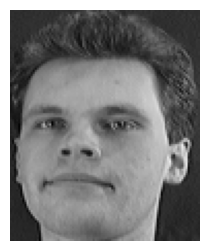

Original Color:
3.pgm


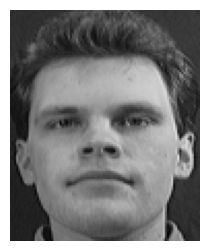

Original Color:
8.pgm


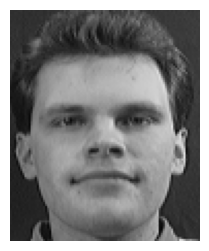

Original Color:
9.pgm


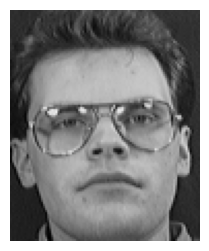

Original Color:
10.pgm


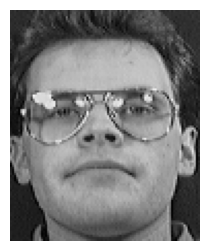

Original Color:
7.pgm


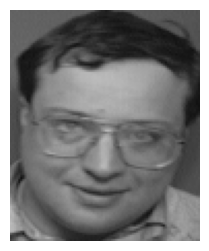

Original Color:
6.pgm


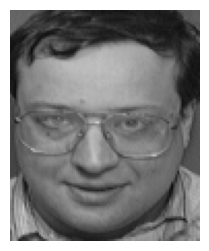

Original Color:
4.pgm


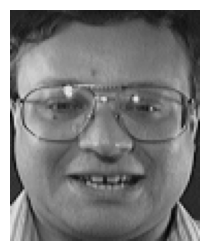

Original Color:
5.pgm


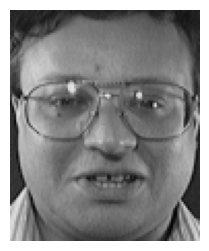

Original Color:
1.pgm


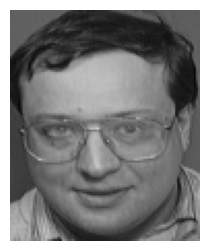

Original Color:
2.pgm


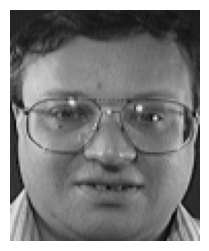

Original Color:
3.pgm


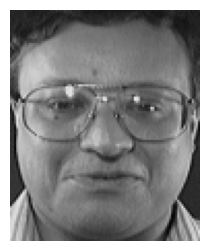

Original Color:
8.pgm


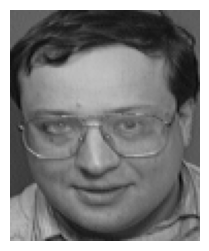

Original Color:
9.pgm


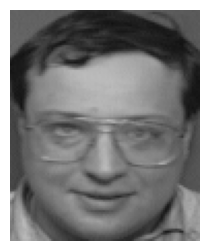

Original Color:
10.pgm


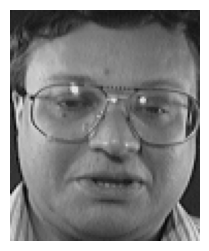

Original Color:
7.pgm


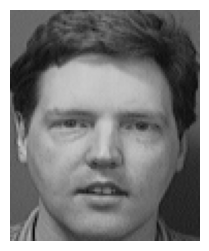

Original Color:
6.pgm


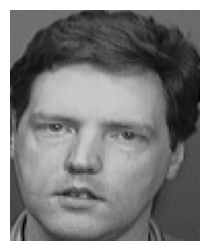

Original Color:
4.pgm


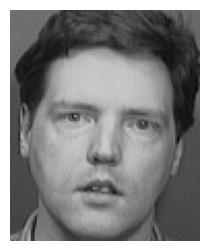

Original Color:
5.pgm


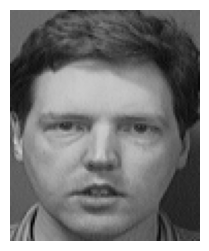

Original Color:
1.pgm


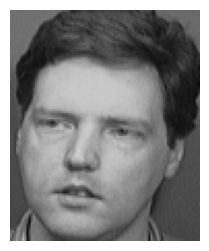

Original Color:
2.pgm


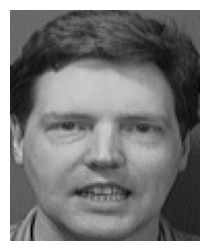

Original Color:
3.pgm


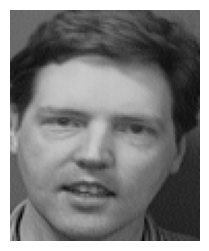

Original Color:
8.pgm


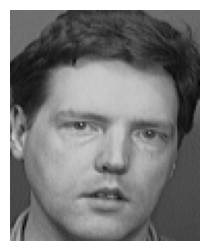

Original Color:
9.pgm


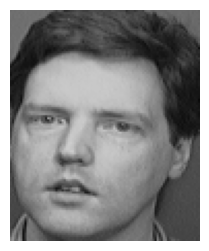

Original Color:
10.pgm


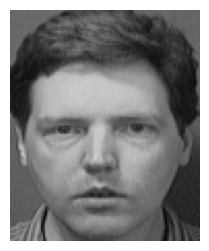

Original Color:
7.pgm


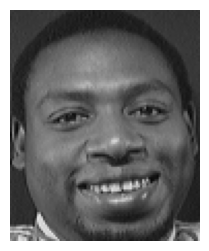

Original Color:
6.pgm


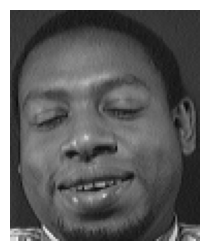

Original Color:
4.pgm


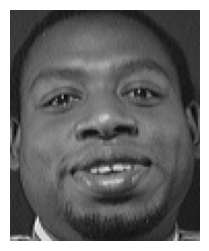

Original Color:
5.pgm


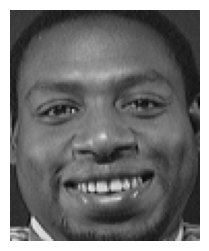

Original Color:
1.pgm


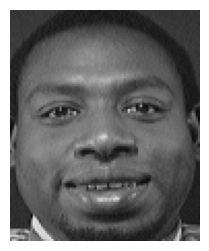

Original Color:
2.pgm


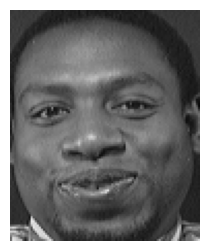

Original Color:
3.pgm


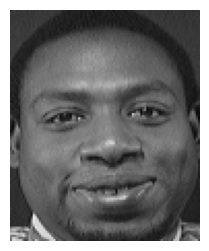

Original Color:
8.pgm


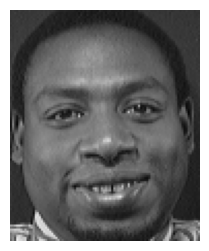

Original Color:
9.pgm


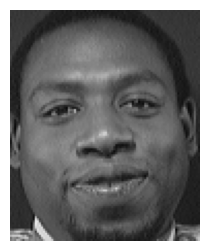

Original Color:
10.pgm


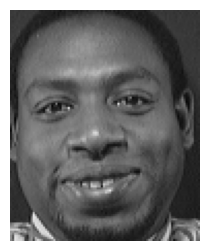

Original Color:
7.pgm


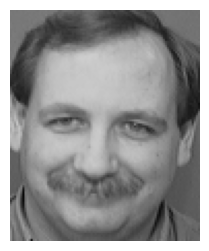

Original Color:
6.pgm


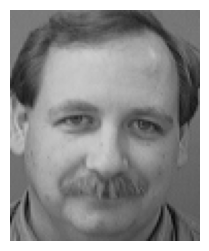

Original Color:
4.pgm


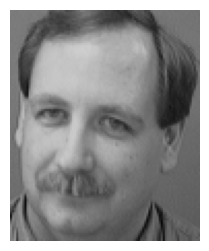

Original Color:
5.pgm


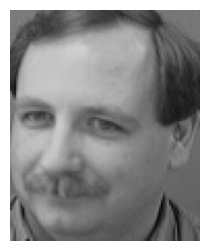

Original Color:
1.pgm


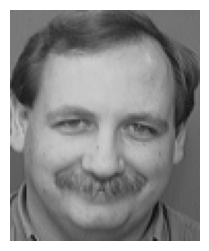

Original Color:
2.pgm


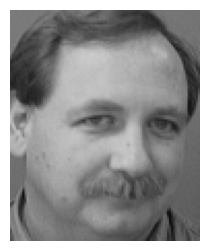

Original Color:
3.pgm


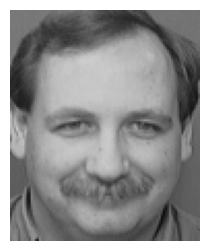

Original Color:
8.pgm


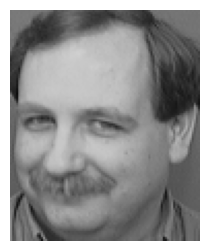

Original Color:
9.pgm


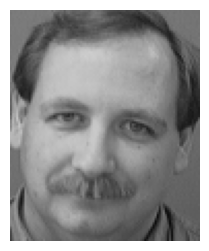

Original Color:
10.pgm


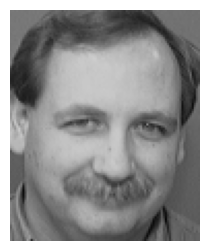

Original Color:
7.pgm


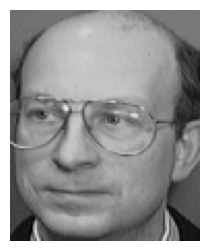

Original Color:
6.pgm


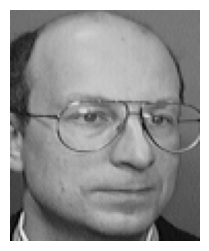

Original Color:
4.pgm


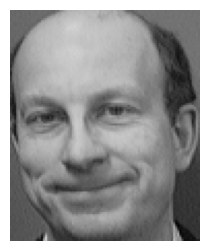

Original Color:
5.pgm


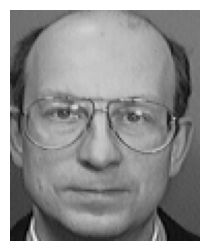

Original Color:
1.pgm


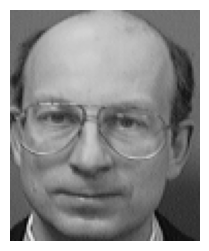

Original Color:
2.pgm


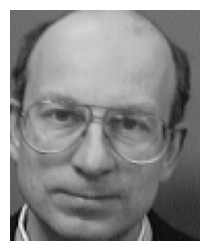

Original Color:
3.pgm


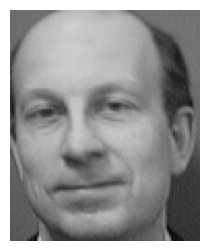

Original Color:
8.pgm


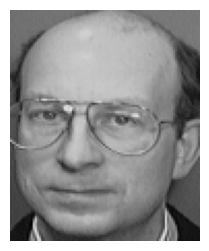

Original Color:
9.pgm


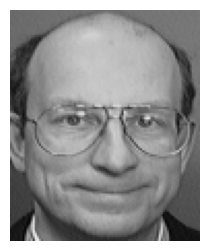

Original Color:
10.pgm


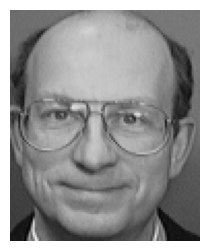

Original Color:
7.pgm


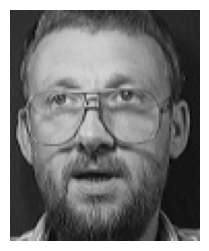

Original Color:
6.pgm


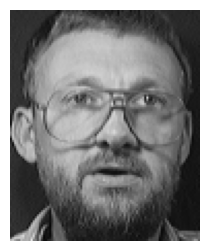

Original Color:
4.pgm


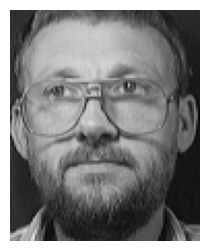

Original Color:
5.pgm


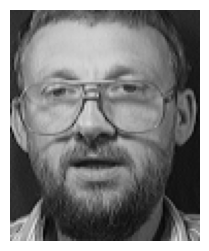

Original Color:
1.pgm


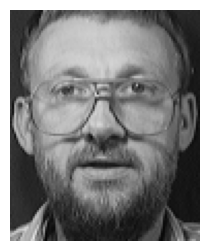

Original Color:
2.pgm


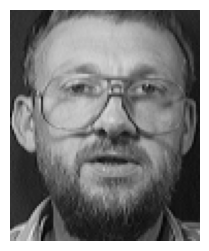

Original Color:
3.pgm


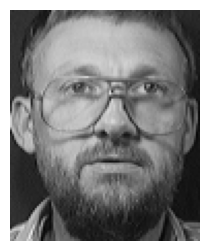

Original Color:
8.pgm


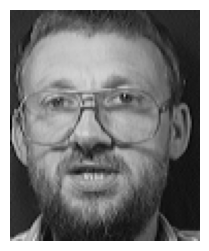

Original Color:
9.pgm


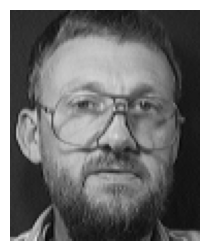

Original Color:
10.pgm


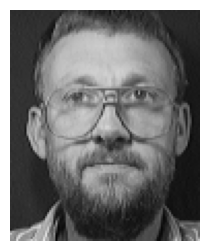

Original Color:
7.pgm


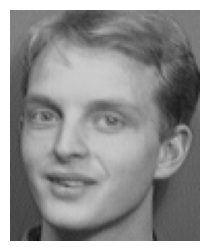

Original Color:
6.pgm


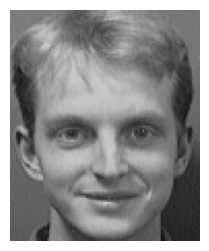

Original Color:
4.pgm


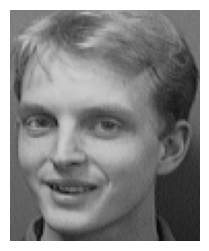

Original Color:
5.pgm


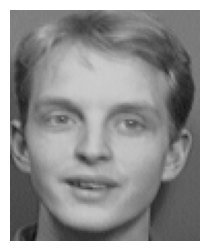

Original Color:
1.pgm


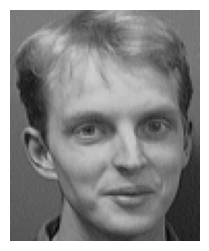

Original Color:
2.pgm


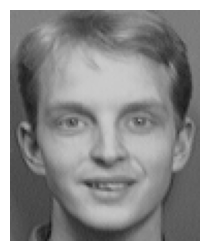

Original Color:
3.pgm


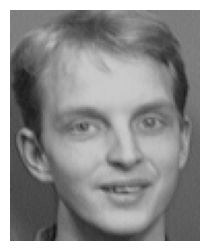

Original Color:
8.pgm


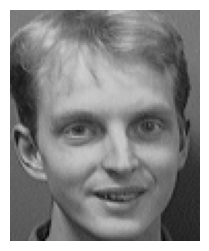

Original Color:
9.pgm


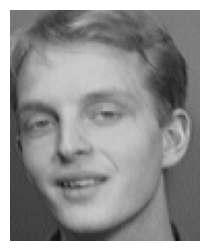

Original Color:
10.pgm


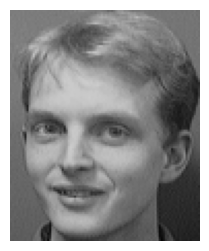

Original Color:
7.pgm


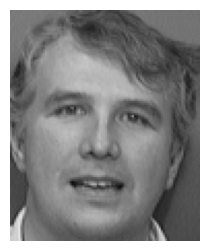

Original Color:
6.pgm


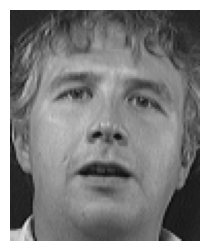

Original Color:
4.pgm


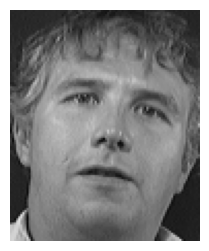

Original Color:
5.pgm


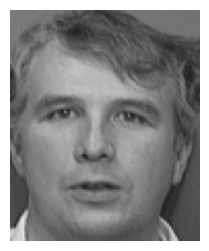

Original Color:
1.pgm


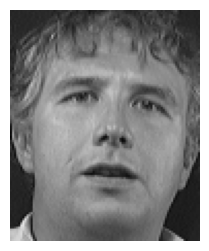

Original Color:
2.pgm


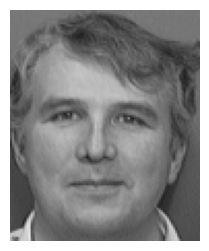

Original Color:
3.pgm


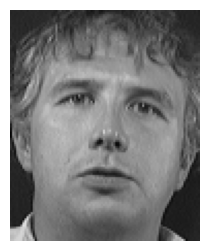

Original Color:
8.pgm


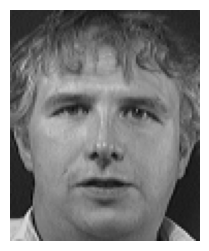

Original Color:
9.pgm


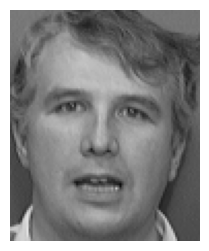

Original Color:
10.pgm


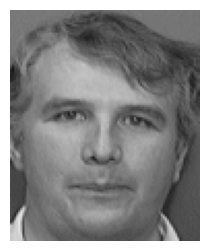

Original Color:
7.pgm


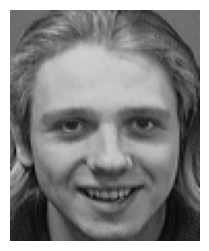

Original Color:
6.pgm


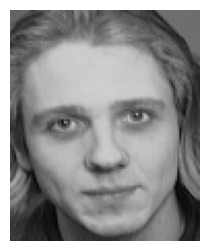

Original Color:
4.pgm


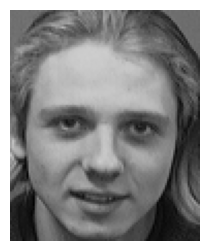

Original Color:
5.pgm


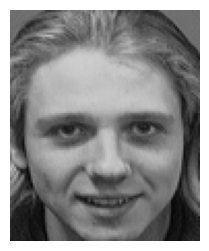

Original Color:
1.pgm


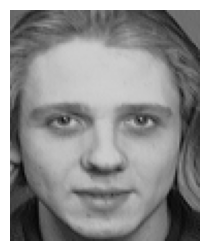

Original Color:
2.pgm


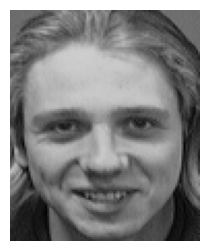

Original Color:
3.pgm


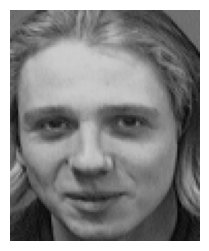

Original Color:
8.pgm


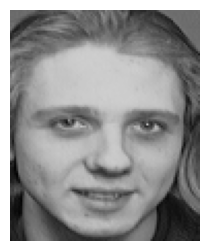

Original Color:
9.pgm


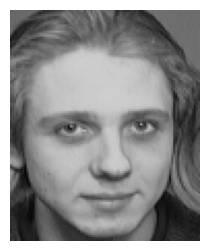

Original Color:
10.pgm


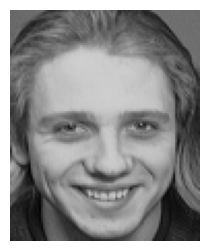

Original Color:
7.pgm


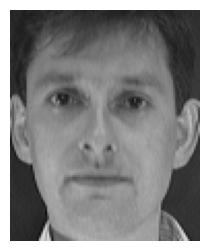

Original Color:
6.pgm


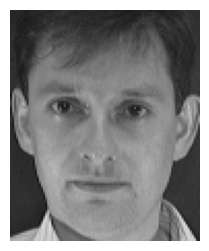

Original Color:
4.pgm


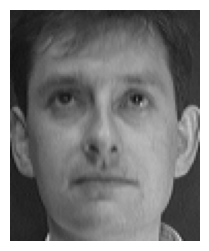

Original Color:
5.pgm


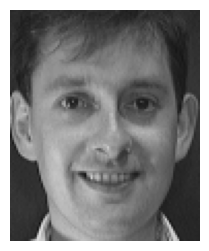

Original Color:
1.pgm


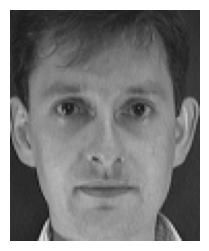

Original Color:
2.pgm


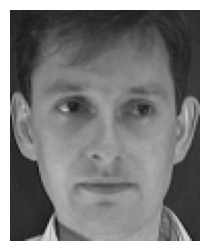

Original Color:
3.pgm


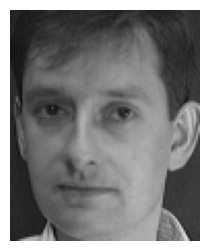

Original Color:
8.pgm


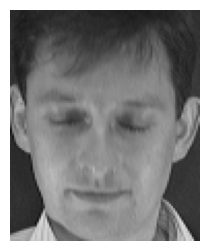

Original Color:
9.pgm


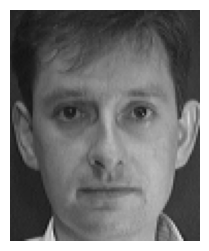

Original Color:
10.pgm


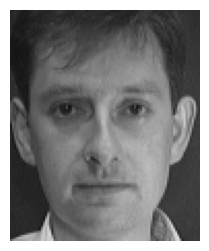

Original Color:
7.pgm


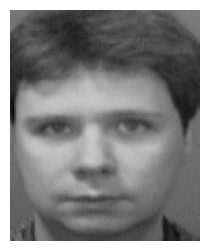

Original Color:
6.pgm


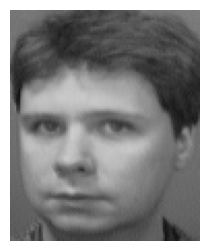

Original Color:
4.pgm


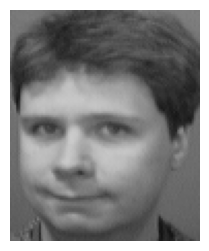

Original Color:
5.pgm


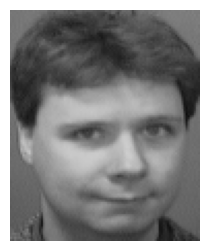

Original Color:
1.pgm


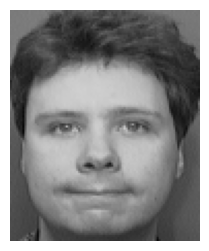

Original Color:
2.pgm


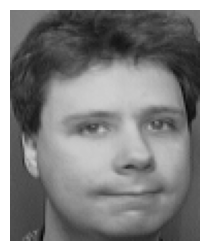

Original Color:
3.pgm


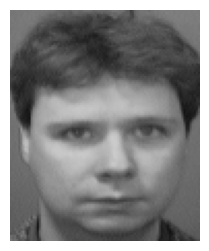

Original Color:
8.pgm


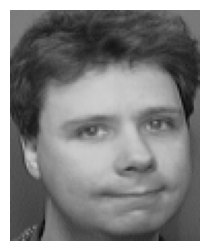

Original Color:
9.pgm


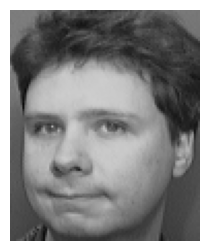

Original Color:
10.pgm


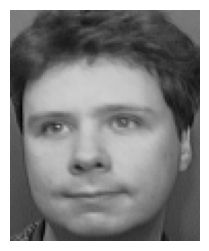

Original Color:


In [5]:
def scan_folder(parent):
    # iterate over all the files in directory 'parent'
    for file_name in os.listdir(parent):
        if file_name.endswith((".pgm")):
            # if it's an image file, print its name and display the image
            print(file_name)
            image_path = os.path.join(parent, file_name)
            display_image(image_path)
        else:
            current_path = os.path.join(parent, file_name)
            if os.path.isdir(current_path):
                # if we're checking a sub-directory, recursively call this method
                scan_folder(current_path)

def display_image(image_path):
    plt.figure(figsize=(3, 3))
    try:
        img = mpimg.imread(image_path)
        img2 = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        if isinstance(img2, np.ndarray):
            imgplot = plt.imshow(img2, vmin=0, vmax=255)
            plt.axis('off')
            plt.show()

            print("Original Color:")
            for row in range(img2.shape[0]):
                for col in range(img2.shape[1]):
                    pixel = img2[row, col]
                    #print(f"R: {pixel[0]}, G: {pixel[1]}, B: {pixel[2]}")
        else:
            print(f"Unable to read image: {image_path}")
    except IOError:
        print(f"Unable to open image: {image_path}")

scan_folder("/Users/alinahasan/Desktop/ATnT")  # Insert parent directory's path

In [6]:
#Function to flattened image 
def get_pixels_values(image):
    with open(image,'rb')as pgmf:
        im=plt.imread(pgmf)
    im=np.reshape(im, im.shape[0]*im.shape[1])
    return list(im)


In [7]:
# Load flattened images and their labels to image_vectorized_data and labels

X_train, Y_train, X_test, Y_test = [], [], [], []

for subject_folder in data:
    image_collection = os.listdir(root + "/" + subject_folder)
    all_images, all_labels = [], []

    # for each image in subject folder
    for image in image_collection:
        # create a single row vector of this image and append to image_vectorized_data
        all_images.append(get_pixels_values(root +"/"+ subject_folder + "/" + image))
        all_labels.append(int(subject_folder.split('s')[1]))

    # Divide this subject images into train and test -> need to have at least 1 image from each subject
    x_train_sub, x_test_sub, y_train_sub, y_test_sub = train_test_split(np.array(all_images), np.array(all_labels), test_size=0.2)

    X_train.extend(x_train_sub.tolist())
    Y_train.extend(y_train_sub.tolist())
    X_test.extend(x_test_sub.tolist())
    Y_test.extend(y_test_sub.tolist())

X_train, Y_train, X_test, Y_test = np.array(X_train), np.array(Y_train), np.array(X_test), np.array(Y_test)

print(X_train.shape)
print(X_test.shape)
print(Y_train.shape)
print(Y_test.shape)


(320, 10304)
(80, 10304)
(320,)
(80,)


## Implement PCA Algorithm
Steps :-
1. Make input matrix column standardized i.e substract mean from every input vector ->X
2. Find Covariance Matrix for X -> S
3. Find Eigen Vectors of S
4. Sort eigen vectors on the basis of corresponding eigen values in desc order.
5. Take k eigen vectors -> based on the no. of desired features.
6. Project every input pt. in X into eigen space. -> final dimensionality reduced vectors.

In [8]:
# Implement pca in the following function

def principalComponentAnalysis(X, no_of_components):
    # Get no of data points
    N = X.shape[0]
    
    # calculate pixel wise mean of X
    mean_X = np.mean(X, axis = 0)
    
    # substract mean from X
    col_standardized_X = X - mean_X[None:, ]
    
    # find covariance matrix
    S = np.dot(col_standardized_X.T, col_standardized_X) / (N - 1)
    print(S.shape)
    # find top <number_of_components> eigen vectors of S with highest eigen values
    eigen_values, eigen_vectors = eigh(S, subset_by_index = [S.shape[1] - no_of_components, S.shape[1] - 1])
    
    eigen_vectors = np.fliplr(eigen_vectors)
    eigen_values = np.flip(eigen_values)
    
    return eigen_vectors, mean_X

In [9]:
print(X_test.shape)
print(Y_test.shape)

(80, 10304)
(80,)


In [10]:
from scipy.linalg import eigh
eigen_vectors, mean_face_train = principalComponentAnalysis(X_train, X_train.shape[1])
eigen_vectors = eigen_vectors.T

(10304, 10304)


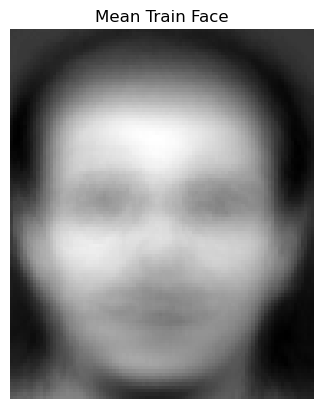

In [11]:
# Plotting the mean face
plt.title("Mean Train Face")
plt.axis("off")
plt.imshow(mean_face_train.reshape(112,92), cmap="gray")

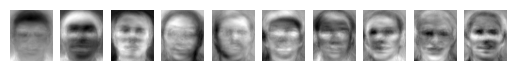

In [12]:
# Plotting Eigen Vectors -> top 10
for i in range(10):
    ev = eigen_vectors[i]
    eign_image = ev.reshape(112, 92)
    plt.subplot(1, 10, i + 1)
    plt.axis('off')
    plt.imshow(eign_image, cmap="gray")

In [13]:
# Compute distance between input face and training images in the face space

def model(eigen_vectors, image, X_train, mean_face_train, Y_train):
    image = image - mean_face_train[None:,]
    eigen_face_test = np.dot(image, eigen_vectors.T) # 1 x k
    
    x_train = X_train - mean_face_train[None:,]
    eigen_faces = np.dot(x_train, eigen_vectors.T) # n x k
    
    diff = eigen_faces - eigen_face_test
    weights = LA.norm(diff, axis=1) 
    
    closest_img_idx = np.argmin(weights)
    dist = weights[closest_img_idx]
    pred_label = Y_train[closest_img_idx]
    
    return dist, pred_label, X_train[closest_img_idx]
   

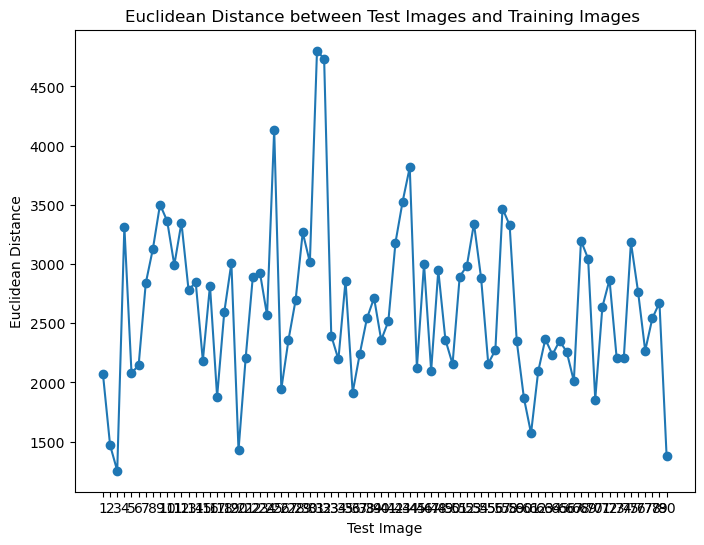

In [16]:
# Plotting euclidean distance between test images and training images

import matplotlib.pyplot as plt

distances = []

for i in range(len(X_test)):
    dist, _, _ = model(eigen_vectors, X_test[i], X_train, mean_face_train, Y_train)
    distances.append(dist)

plt.figure(figsize=(8, 6))
plt.plot(range(len(X_test)), distances, marker='o')
plt.xlabel('Test Image')
plt.ylabel('Euclidean Distance')
plt.title('Euclidean Distance between Test Images and Training Images ')
plt.xticks(range(len(X_test)), range(1, len(X_test) + 1))
plt.show()




In [17]:
# Plotting accuracy and mean squared error 
K = []
mse = []
acc = []

for k in [5,10,50,100,1000]:
    evec = eigen_vectors[:k,]
    not_match = 0
    squared_error = 0.0
    
    for i, image in enumerate(X_test):    
        actual_label = Y_test[i]
        dist, pred_label, closest_image = model(evec, image, X_train, mean_face_train, Y_train)
        dist /= k
        squared_error += (dist * dist)

        if(pred_label != actual_label):
            not_match += 1
    
    K.append(k)
    mse.append(squared_error / X_test.shape[0])
    acc.append((1 - (not_match / X_test.shape[0])) * 100)

In [18]:
for i in range(len(K)):
    print(f"For k = {K[i]}:")
    print(f"  Accuracy: {acc[i]}%")
    print(f"  MSE: {mse[i]}")
    print()

For k = 5:
  Accuracy: 85.0%
  MSE: 13339.489304850495

For k = 10:
  Accuracy: 95.0%
  MSE: 8024.6480859545245

For k = 50:
  Accuracy: 95.0%
  MSE: 930.1287749279184

For k = 100:
  Accuracy: 95.0%
  MSE: 321.09297709693266

For k = 1000:
  Accuracy: 95.0%
  MSE: 5.0032506284653735



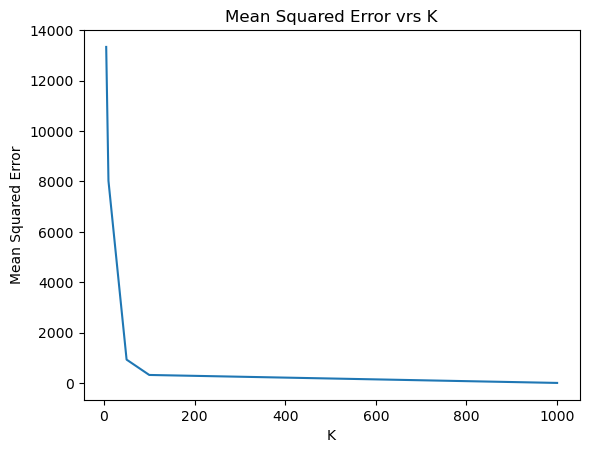

In [19]:
# Plotting graph between mean squared error and accuracy
xpoints = np.array(K)
ypoints = np.array(mse)

plt.xlabel('K')
plt.ylabel('Mean Squared Error')
plt.title("Mean Squared Error vrs K")
plt.plot(xpoints, ypoints)

plt.show()

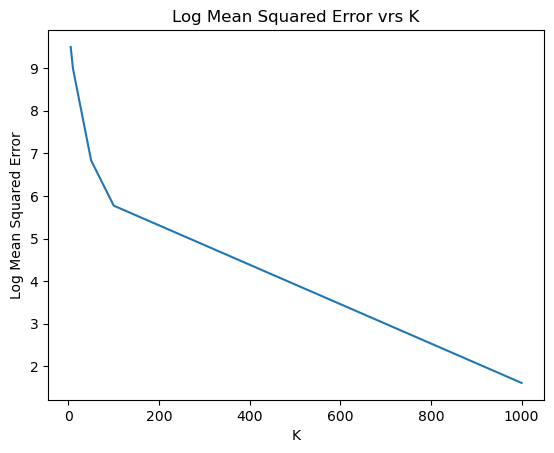

In [20]:
#  Plotting graph between log mean squared error and accuracy
xpoints = np.array(K)
ypoints = np.log(mse)

plt.xlabel('K')
plt.ylabel('Log Mean Squared Error')
plt.title("Log Mean Squared Error vrs K")
plt.plot(xpoints, ypoints)

plt.show()


Visualise the results for different number of principal components(pc = 5,10,100, 1000, all).

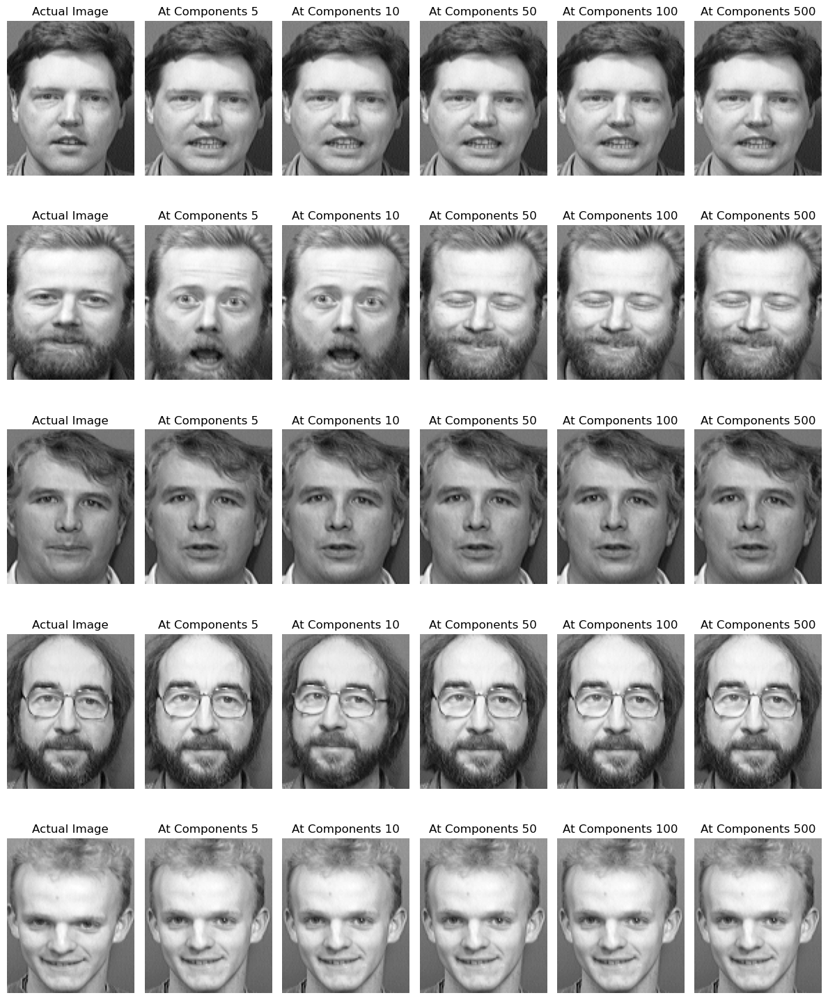

In [21]:
# impact of the number of components on the quality of image reconstruction.
indx = random.sample(range(1, X_test.shape[0]), 5)
components = [5,10,50,100,500]

plt.figure(figsize = (12,15))

for l, i in enumerate(indx):
    plt.subplot(len(indx), len(components) + 1, (l * (1 + len(components)) + 1))
    plt.axis('off')
    plt.title('Actual Image')
    plt.imshow(X_test[i].reshape(112, 92), cmap="gray")
    
    for j, k in enumerate(components):
        image = X_test[i]
        evec = eigen_vectors[:k, ]
        dist, pred_label, closest_img_train = model(evec, image, X_train, mean_face_train, Y_train)
        closest_img_train = closest_img_train.reshape(112, 92)
        
        plt.subplot(len(indx), len(components) + 1, (l * (1 + len(components)) + j + 2))
        plt.axis('off')
        plt.title(f'At Components {k}')
        plt.imshow(closest_img_train, cmap="gray")
plt.tight_layout()
plt.show()

In [22]:
# Accuracy of the face recognition algorithm(pca)
not_match = 0

for i, image in enumerate(X_test):
    actual_label = Y_test[i]
    dist, pred_label, _ = model(eigen_vectors, image, X_train, mean_face_train, Y_train)
    
    if pred_label != actual_label:
        not_match += 1

accuracy = (1 - (not_match / X_test.shape[0])) * 100
print(f"Accuracy: {accuracy}%")

Accuracy: 95.0%


#### Implement Image Reconstruction from Eigenfaces
 Steps for Image Reconstrcution from Eigen Faces :-

1. Multiply input image to Transpose of K eigen vectors -> Eigen Faces 
2. Multiply eigen face to eigen vector to get the image.
3. Reshape image.

i.e. X(1 * d) @ EV.T(d * k) = EF(1 * k)
and  EF(1 * k) @ EV(k * d) -> reconstructed image

In [23]:
# Function to implement image reconstruction by taking arguements as necessary.
def imageReconstruction(eigen_vectors, image):
    # image -> (1 x d)
    # eigen_vectors -> (k x d)
    return np.dot(image, np.dot(eigen_vectors.T, eigen_vectors)) # (1 x d) image

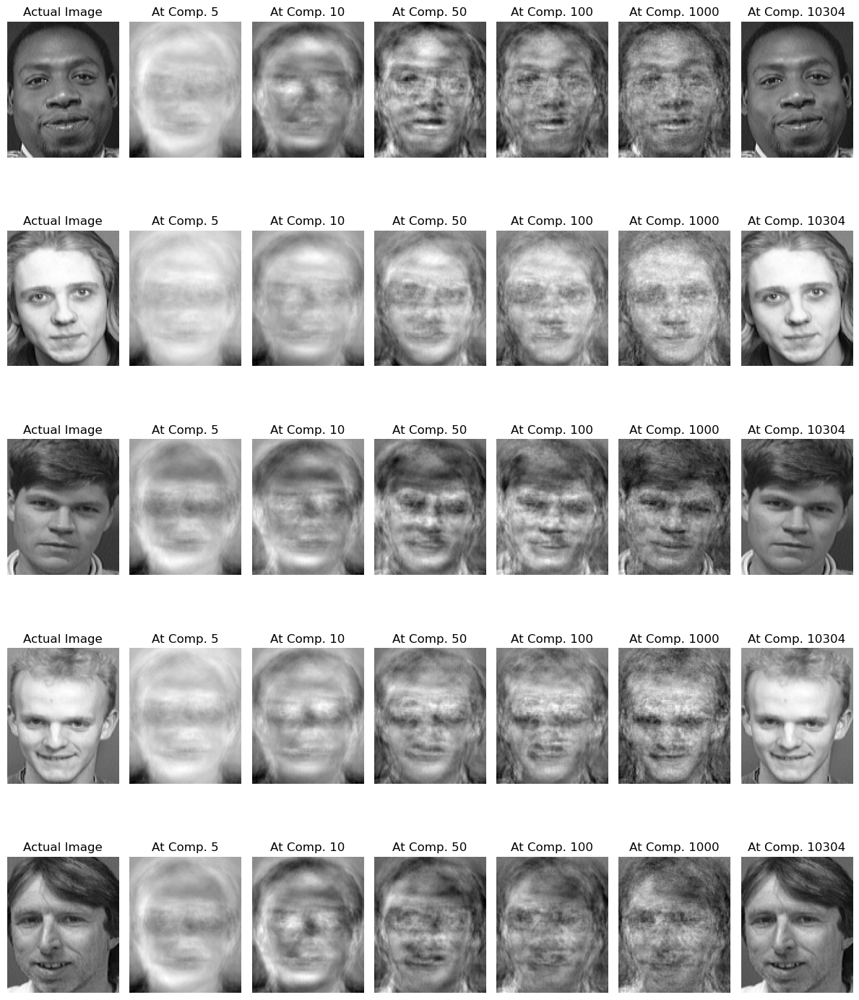

In [24]:
indx = random.sample(range(1, X_test.shape[0]), 5)
components = [5,10,50,100,1000, X_test.shape[1]]

plt.figure(figsize = (12,15))

for l, i in enumerate(indx):
    plt.subplot(len(indx), len(components) + 1, (l * (1 + len(components)) + 1))
    plt.axis('off')
    plt.title('Actual Image')
    plt.imshow(X_test[i].reshape(112, 92), cmap="gray")
    
    for j, k in enumerate(components):
        image = X_test[i]
        evec = eigen_vectors[:k, ]
        recons_img = imageReconstruction(evec, image).reshape(112, 92)
        
        plt.subplot(len(indx), len(components) + 1, (l * (1 + len(components)) + j + 2))
        plt.axis('off')
        plt.title(f'At Comp. {k}')
        plt.imshow(recons_img, cmap="gray")
plt.tight_layout()
plt.show()

On increasing the no of components, the variance explained will be increased and hence more clearer image will be generated. After some dimensions, the variance explained will almost same and hence the reconstructed image will not be significantly effected. SO, we can reduce the non relevant dimensions.

In context of face recognition :- 
1. PCA can be less effective in recognizing faces with objects such as eyeglasses, hats, etc. Because PCA relies on the overall structure and geometry of the face, which can be disrupted by these objects.
2. Assumption -> Face are capturd in same condition -> but this may not be the case always.